# Auto-encoders

Até o momento, trabalhamos com a ideia de encontrar mapeamentos de textos para classes. Para isso, passamos por uma etapa que é encontrar uma representação intermediária para os textos. Agora, vamos tentar encontrar representações intermediárias à partir de dados não-rotulados, isto é, com a ideia de que vamos reduzir a dimensionalidade dos dados de entrada buscando minimizar ao máximo o erro de reconstituição.

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

from keras.layers import Input, Dense, Activation, TextVectorization, Reshape, RepeatVector, Conv1D, AveragePooling1D, UpSampling1D, Embedding, GlobalAveragePooling1D, LSTM
from keras.models import Model
import tensorflow as tf

import plotly.express as px

## Exercício 1
**Objetivo: usar um auto-encoder linear (PCA)**

1. Leia e interprete o código abaixo e explique o que está acontecendo.
1. O que está sendo plotado?
1. Por que esse plot não tem o formato de linha que vimos até agora? 

In [2]:
df = pd.read_csv('datasets/IMDB Dataset.csv')
reviews = df['review']
vocab_size = 1000
vectorize_layer = TextVectorization(output_mode='multi_hot', max_tokens=vocab_size, pad_to_max_tokens=True)
vectorize_layer.adapt(reviews)
X = vectorize_layer(reviews)

In [5]:
def pca_autoencoder(vocab_size):
    input_layer = Input(shape=(vocab_size,))
    x = input_layer
    x_enc = Dense(2, name='encoder')(x)
    x = Dense(vocab_size, name='decoder')(x_enc)
    return Model(input_layer, x), Model(input_layer, x_enc)

# multi hot enconding -> cada documento vira um vetor
## 1 se tiver a palavra e 0 se não tiver

pca, enc = pca_autoencoder(vocab_size)
print(pca.summary())
pca.compile(loss='mse')
history = pca.fit(X, X, epochs=5, verbose=1)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1000)]            0         
                                                                 
 encoder (Dense)             (None, 2)                 2002      
                                                                 
 decoder (Dense)             (None, 1000)              3000      
                                                                 
Total params: 5,002
Trainable params: 5,002
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0619
Epoch 2/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0598
Epoch 3/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0594
Epoch 4/5
1563/1563 [==============================] - 3s 2ms/step - l

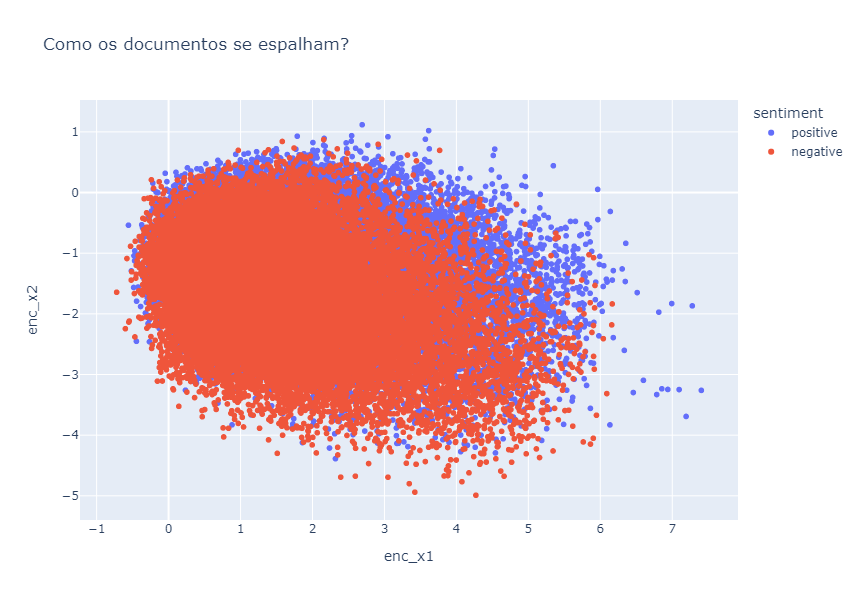

<Figure size 432x288 with 0 Axes>

In [4]:
X_enc = enc(X)
df['enc_x1'] = X_enc[:,0]
df['enc_x2'] = X_enc[:,1]

plt.figure()
fig = px.scatter(df, x="enc_x1", y="enc_x2", color="sentiment", title="Como os documentos se espalham?", width=600, height=600)
fig.show()

# Exercício 2
**Objetivo: entender o autoencoder como uma sequência de um encoder e um decoder**

O código abaixo é equivalente ao código anterior que fizemos. Como funciona o "encoder"? Como funciona o "decoder"? Explique a função de cada um deles.

In [6]:
def encoder(vocab_size, target_size):
    input_layer = Input(shape=(vocab_size,))
    x = input_layer
    x = Dense(target_size, name='encoder')(x)
    return Model(input_layer, x)

def decoder(latent_size, target_size):
    input_layer = Input(shape=(latent_size,))
    x = input_layer
    x = Dense(target_size, name='decoder')(x)
    return Model(input_layer, x)

def autoencoder(encoder, decoder):
    in_shape = encoder.layers[0].input_shape[0]
    input_layer = Input(shape=in_shape)
    x = input_layer
    x = encoder(x)
    x = decoder(x)
    return Model(input_layer, x)

In [7]:
enc = encoder(vocab_size, 2)
#print(enc.layers[0].input_shape)
dec = decoder(2, vocab_size)
ae = autoencoder(enc, dec)

ae.compile(loss='mse')
#print(enc.get_layer('encoder').weights[0][0:5])
history = ae.fit(X, X, epochs=5, verbose=1)
#print(enc.get_layer('encoder').weights[0][0:5])

Epoch 1/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0616
Epoch 2/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0597
Epoch 3/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0594
Epoch 4/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0593
Epoch 5/5
1563/1563 [==============================] - 3s 2ms/step - loss: 0.0593


# Exercício 3
**Objetivo: entender autoencoders como mapeadores**

Podemos adicionar não-linearidades (ativações) tanto ao encoder quanto ao decoder. Com isso, podemos potencialmente aumentar a expressividade do nosso encoder e do decoder.

1. Verifique o erro de aproximação do autoencoder como está implementado.
1. Adicione camadas ao encoder e ao decoder de forma que o processo de redução de dimensão seja gradual, isto é, a queda de dimensão entre duas camadas seja mais suave que a atual. O que acontece com o modelo, com a representação, e com o erro de reconstituição?

In [15]:
def encoder(vocab_size, target_size):
    input_layer = Input(shape=(vocab_size,))
    x = input_layer
    x = Dense(vocab_size/2, activation='sigmoid')(x)
    x = Dense(target_size, activation='tanh')(x)
    return Model(input_layer, x)

def decoder(latent_size, target_size):
    input_layer = Input(shape=(latent_size,))
    x = input_layer
    x = Dense(target_size/2, activation='tanh')(x)
    x = Dense(target_size, activation='sigmoid')(x)
    return Model(input_layer, x)

def autoencoder(encoder, decoder):
    in_shape = encoder.layers[0].input_shape[0]
    input_layer = Input(shape=in_shape)
    x = input_layer
    x = encoder(x)
    x = decoder(x)
    return Model(input_layer, x)

enc = encoder(vocab_size, 20)
dec = decoder(20, vocab_size)
ae = autoencoder(enc, dec)
ae.compile(loss='mse')
history = ae.fit(X, X, epochs=15, verbose=1)


Epoch 1/15
1563/1563 [==============================] - 18s 11ms/step - loss: 0.0664
Epoch 2/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.0636
Epoch 3/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.0636
Epoch 4/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.0634
Epoch 5/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.0612
Epoch 6/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.0602
Epoch 7/15
1563/1563 [==============================] - 20s 13ms/step - loss: 0.0600
Epoch 8/15
1563/1563 [==============================] - 20s 13ms/step - loss: 0.0600
Epoch 9/15
1563/1563 [==============================] - 18s 11ms/step - loss: 0.0600
Epoch 10/15
1563/1563 [==============================] - 14s 9ms/step - loss: 0.0599
Epoch 11/15
1563/1563 [==============================] - 14s 9ms/step - loss: 0.0599
Epoch 12/15
1563/1563 [==============================] - 15s 9ms/

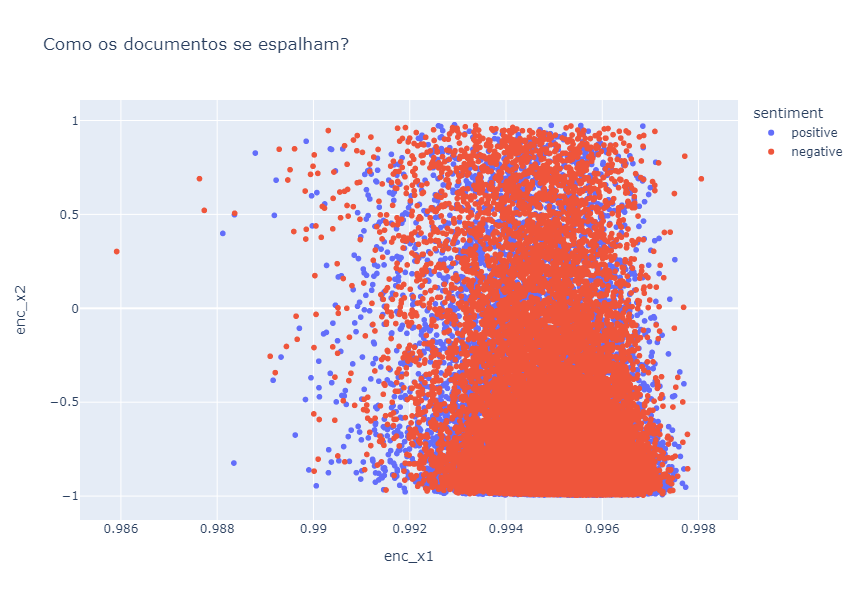

<Figure size 432x288 with 0 Axes>

In [16]:
X_enc = enc(X)
df['enc_x1'] = X_enc[:,0]
df['enc_x2'] = X_enc[:,1]


plt.figure()
fig = px.scatter(df, x="enc_x1", y="enc_x2", color="sentiment", title="Como os documentos se espalham?", width=600, height=600)
fig.show()

# Exercício 4
**Objetivo: entender o auto-encoder auto-regressivo com LSTM**

O código abaixo mostra um auto-enconder auto-regressivo usando LSTM. 

1. Quais são as dimensões da entrada e da saída do encoder?
1. Quais são as dimensões da entrada e da saída do decoder?
1. O auto-encoder não trabalha mais com uma representação tipo bag-of-words, e sim com uma representação one-hot para cada uma das palavras do vocabulário. Qual é o consumo de memória dessa representação?
1. O que é possível visualizar no estado latente encontrado? 

In [17]:
def encoder(seq_len, latent_dim, vocab_size):
    input_layer = Input(shape=(seq_len, vocab_size))
    x = input_layer
    x, state_h, state_c = LSTM(latent_dim, return_state=True)(x)
    return Model(input_layer, [x, state_h, state_c])

def decoder(seq_len, latent_dim, vocab_size):
    input_x = Input(shape=(latent_dim))
    input_h = Input(shape=(latent_dim,))
    input_c = Input(shape=(latent_dim,))
    x = RepeatVector(seq_len)(input_x)
    x = LSTM(latent_dim, return_sequences=True)(x,initial_state=[input_h, input_c])
    x = Dense(vocab_size, activation='softmax')(x)
    return Model([input_x, input_h, input_c], x)

def autoencoder(encoder, decoder):
    in_shape = encoder.layers[0].input_shape[0][1:]
    print(in_shape)
    input_layer = Input(shape=in_shape)
    x = input_layer
    x = encoder(x)
    x = decoder(x)
    return Model(input_layer, x)

enc = encoder(200, 50, 1000)
enc.summary()
dec = decoder(200, 50, 1000)
dec.summary()
ae = autoencoder(enc, dec)
ae.compile(loss='categorical_crossentropy', optimizer='adam')
ae.summary()


Model: "model_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 200, 1000)]       0         
                                                                 
 lstm (LSTM)                 [(None, 50),              210200    
                              (None, 50),                        
                              (None, 50)]                        
                                                                 
Total params: 210,200
Trainable params: 210,200
Non-trainable params: 0
_________________________________________________________________
Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 50)]         0           []                               
 

In [18]:
df = pd.read_csv('datasets/IMDB Dataset.csv').sample(1000)
reviews = df['review']
vocab_size = 1000
vectorize_layer = TextVectorization(max_tokens=vocab_size, output_sequence_length=200)
vectorize_layer.adapt(reviews)
X = vectorize_layer(reviews)
X = tf.one_hot(X, vocab_size)
print(X.shape)


(1000, 200, 1000)


In [19]:
history = ae.fit(X, X, epochs=20, verbose=1)

Epoch 1/20
32/32 [==============================] - 10s 223ms/step - loss: 6.2771
Epoch 2/20
32/32 [==============================] - 7s 216ms/step - loss: 4.5764
Epoch 3/20
32/32 [==============================] - 7s 221ms/step - loss: 4.2575
Epoch 4/20
32/32 [==============================] - 7s 218ms/step - loss: 4.2332
Epoch 5/20
32/32 [==============================] - 7s 222ms/step - loss: 4.2005
Epoch 6/20
32/32 [==============================] - 7s 218ms/step - loss: 4.1585
Epoch 7/20
32/32 [==============================] - 7s 219ms/step - loss: 4.0795
Epoch 8/20
32/32 [==============================] - 7s 220ms/step - loss: 3.9915
Epoch 9/20
32/32 [==============================] - 7s 221ms/step - loss: 3.9319
Epoch 10/20
32/32 [==============================] - 7s 226ms/step - loss: 3.8616
Epoch 11/20
32/32 [==============================] - 7s 219ms/step - loss: 3.8363
Epoch 12/20
32/32 [==============================] - 7s 221ms/step - loss: 3.8188
Epoch 13/20
32/32 [=====

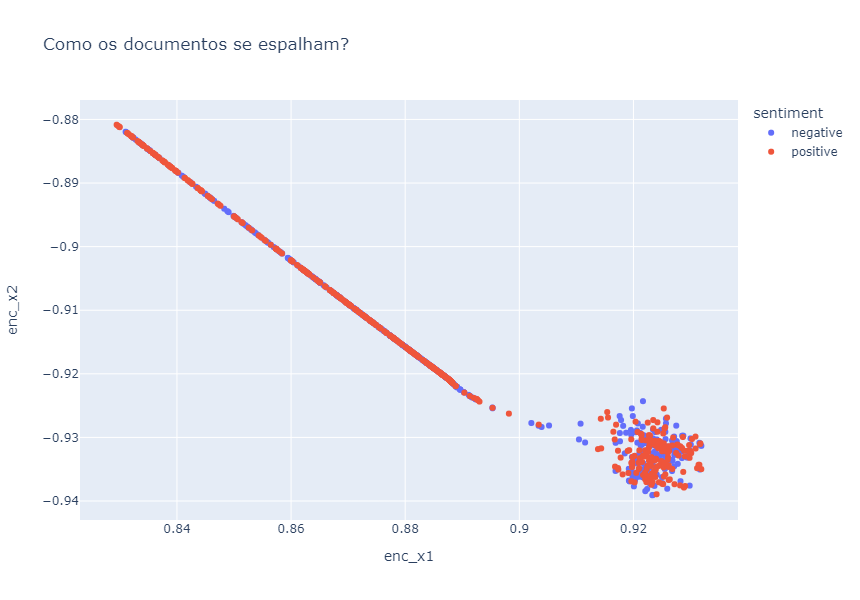

<Figure size 432x288 with 0 Axes>

In [20]:
X_enc, _, _ = enc(X)
df['enc_x1'] = X_enc[:,0]
df['enc_x2'] = X_enc[:,1]
plt.figure()
fig = px.scatter(df, x="enc_x1", y="enc_x2", color="sentiment", title="Como os documentos se espalham?", width=600, height=600)
fig.show()

## Exercício 5
**Objetivo: verificar as ditorções causadas pelo autoencoder de sequências**

O código abaixo permite inserir textos e ler textos gerados pelo autoencoder. Que tipo de distorções você consegue verificar?

In [21]:
textos = df['review'][0:3]
X_ = vectorize_layer(textos)
X_ = tf.one_hot(X_, vocab_size)
X_transf = ae.predict(X_)
X_transf = X_transf.argmax(axis=-1)
X_texts = []
for i in range(X_transf.shape[0]):
    this_text = [vectorize_layer.get_vocabulary()[j] for j in X_transf[i,:]]
    X_texts.append(this_text)
    print(this_text)

1/1 [==============================] - 1s 532ms/step
['[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '

## Exercício 6
**Objetivo: usar um encoder numa downstream task de classificação**

Observe o código abaixo.

1. Como o encoder já treinado é usado?
1. Como "avisamos" ao keras para ajustar ou não os pesos do encoder de acordo com os rótulos da tarefa de classificação?
1. Como o espaço latente do encoder se modifica ao fazermos a tarefa de classificação?

In [22]:
df = pd.read_csv('datasets/IMDB Dataset.csv').sample(1000)
ohe = OneHotEncoder()
y_ohe = ohe.fit_transform(df['sentiment'].to_numpy().reshape((-1,1))).todense()
X_train, X_test, y_train, y_test = train_test_split(df['review'], y_ohe)

reviews = df['review']
vocab_size = 1000
vectorize_layer = TextVectorization(max_tokens=vocab_size, output_sequence_length=200)
vectorize_layer.adapt(X_train)
X_train = vectorize_layer(X_train)
X_train = tf.one_hot(X_train, vocab_size)
X_test = vectorize_layer(X_test)
X_test = tf.one_hot(X_test, vocab_size)

In [23]:
def transfer_classifier(encoder):
    in_shape = encoder.layers[0].input_shape[0][1:]
    input_layer = Input(shape=in_shape)
    x = input_layer
    encoder.trainable=False
    x, _, _ = encoder(x)
    x = Dense(2, name='classificador')(x)
    x = Activation('softmax')(x)
    return Model(input_layer, x)

clf = transfer_classifier(encoder=enc)
print(clf.summary())
clf.compile(loss='categorical_crossentropy', metrics=['accuracy'])
history = clf.fit(X_train, y_train, epochs=20, verbose=1, validation_split=0.1)
clf.evaluate(X_test, y_test)

Model: "model_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, 200, 1000)]       0         
                                                                 
 model_25 (Functional)       [(None, 50),              210200    
                              (None, 50),                        
                              (None, 50)]                        
                                                                 
 classificador (Dense)       (None, 2)                 102       
                                                                 
 activation (Activation)     (None, 2)                 0         
                                                                 
Total params: 210,302
Trainable params: 102
Non-trainable params: 210,200
_________________________________________________________________
None
Epoch 1/20
22/22 [===========================

[0.6959282159805298, 0.5239999890327454]

In [24]:
def transfer_classifier(encoder):
    in_shape = encoder.layers[0].input_shape[0][1:]
    input_layer = Input(shape=in_shape)
    x = input_layer
    encoder.trainable=True
    x, _, _ = encoder(x)
    x = Dense(2, name='classificador')(x)
    x = Activation('softmax')(x)
    return Model(input_layer, x)

clf = transfer_classifier(encoder=enc)
print(clf.summary())
clf.compile(loss='categorical_crossentropy', metrics=['accuracy'])
history = clf.fit(X_train, y_train, epochs=20, verbose=1, validation_split=0.1)
clf.evaluate(X_test, y_test)

Model: "model_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_30 (InputLayer)       [(None, 200, 1000)]       0         
                                                                 
 model_25 (Functional)       [(None, 50),              210200    
                              (None, 50),                        
                              (None, 50)]                        
                                                                 
 classificador (Dense)       (None, 2)                 102       
                                                                 
 activation_1 (Activation)   (None, 2)                 0         
                                                                 
Total params: 210,302
Trainable params: 210,302
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/20
22/22 [=============================

[0.7091628313064575, 0.5120000243186951]

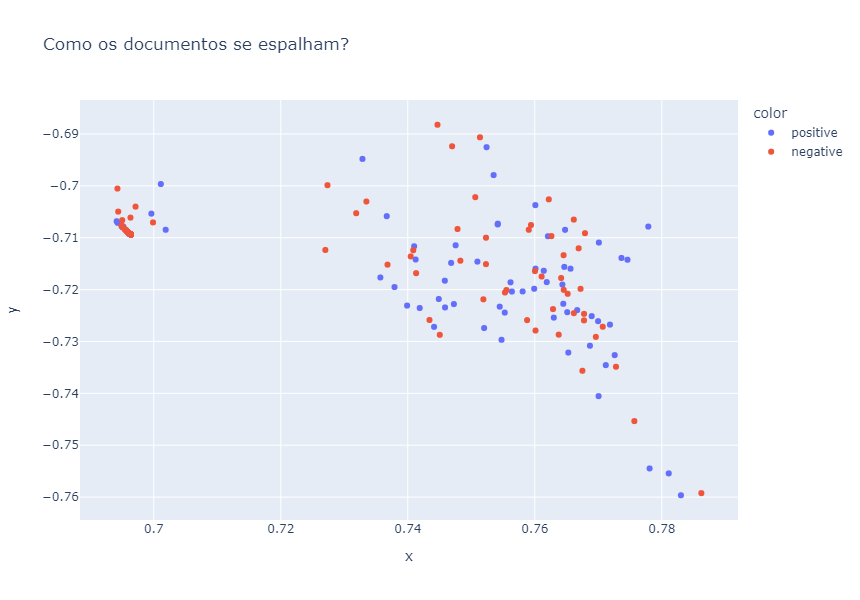

<Figure size 432x288 with 0 Axes>

In [25]:
X_enc, _, _ = enc(X_test)
# df['enc_x1'] = X_enc[:,0]
# df['enc_x2'] = X_enc[:,1]
tags = ohe.inverse_transform(np.asarray(y_test)).reshape( (-1,))
plt.figure()
fig = px.scatter(x=X_enc[:,0], y=X_enc[:,1], color=tags, title="Como os documentos se espalham?", width=600, height=600)
fig.show()

## Exercício 7
**Objetivo: analisar o pré-treinamento de um encoder convolucional**

O código abaixo faz o mesmo que foi feito com a LSTM, mas agora com uma CNN.

1. Como os resultados obtidos se compararm aos da LSTM?
1. Como os resultados obtidos se comparam aos que foram obtidos na aula anterior?
1. Por que existem essas diferenças?
1. Quais seriam passos relevantes para mitigar esses problemas futuramente?

In [26]:
def convolve_and_downsample(input_n_samples, input_embedding_size, n_filters, kernel_size=3, **kwargs):
    input_layer = Input(shape=(input_n_samples,input_embedding_size))
    x = input_layer
    x = Conv1D( filters=n_filters,
                kernel_size=kernel_size,
                padding='same',
                use_bias=False,
                )(x)
    x = AveragePooling1D(pool_size=2)(x)
    x = Activation('elu')(x)
    return Model(input_layer, x, **kwargs)

def upsample_and_convolve(input_n_samples, input_embedding_size, n_filters, kernel_size=3, **kwargs):
    input_layer = Input(shape=(input_n_samples,input_embedding_size))
    x = input_layer
    x = UpSampling1D(size=2)(x)
    x = Conv1D( filters=n_filters,
                kernel_size=kernel_size,
                padding='same',
                use_bias=False,
                )(x)

    x = Activation('elu')(x)
    return Model(input_layer, x, **kwargs)


In [27]:
def cnn_encoder(seq_len, vocab_size=vocab_size, number_of_ngrams=64, n_gram_size=3):
    input_layer = Input(shape=(seq_len, vocab_size))
    x = input_layer
    x = convolve_and_downsample(128, vocab_size, number_of_ngrams, n_gram_size)(x)
    x = convolve_and_downsample(64, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = convolve_and_downsample(32, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = convolve_and_downsample(16, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = convolve_and_downsample(8, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = convolve_and_downsample(4, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = convolve_and_downsample(2, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    return Model(input_layer, x)

def cnn_decoder(seq_len, vocab_size=vocab_size, number_of_ngrams=64, n_gram_size=3):
    input_layer = Input(shape=(1, number_of_ngrams))
    x = input_layer
    x = upsample_and_convolve(1, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = upsample_and_convolve(2, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = upsample_and_convolve(4, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = upsample_and_convolve(8, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = upsample_and_convolve(16, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = upsample_and_convolve(32, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = upsample_and_convolve(64, number_of_ngrams, number_of_ngrams, n_gram_size)(x)
    x = Dense(vocab_size, name='classificador')(x)
    x = Activation('softmax')(x)
    return Model(input_layer, x)


enc = cnn_encoder(128, 1000)
enc.summary()
dec = cnn_decoder(128, 1000)
dec.summary()
ae = autoencoder(enc, dec)
ae.compile(loss='categorical_crossentropy', optimizer='adam')
ae.summary()

Model: "model_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_31 (InputLayer)       [(None, 128, 1000)]       0         
                                                                 
 model_30 (Functional)       (None, 64, 64)            192000    
                                                                 
 model_31 (Functional)       (None, 32, 64)            12288     
                                                                 
 model_32 (Functional)       (None, 16, 64)            12288     
                                                                 
 model_33 (Functional)       (None, 8, 64)             12288     
                                                                 
 model_34 (Functional)       (None, 4, 64)             12288     
                                                                 
 model_35 (Functional)       (None, 2, 64)             122

In [28]:
df = pd.read_csv('datasets/IMDB Dataset.csv').sample(1000)
reviews = df['review']
vocab_size = 1000
vectorize_layer = TextVectorization(max_tokens=vocab_size, output_sequence_length=128)
vectorize_layer.adapt(reviews)
X = vectorize_layer(reviews)
X = tf.one_hot(X, vocab_size)
print(X.shape)

(1000, 128, 1000)


In [29]:
history = ae.fit(X, X, epochs=20, verbose=1)

Epoch 1/20
32/32 [==============================] - 4s 89ms/step - loss: 5.3760
Epoch 2/20
32/32 [==============================] - 3s 86ms/step - loss: 4.6759
Epoch 3/20
32/32 [==============================] - 3s 87ms/step - loss: 4.5357
Epoch 4/20
32/32 [==============================] - 3s 87ms/step - loss: 4.4533
Epoch 5/20
32/32 [==============================] - 3s 93ms/step - loss: 4.4517
Epoch 6/20
32/32 [==============================] - 3s 91ms/step - loss: 4.4331
Epoch 7/20
32/32 [==============================] - 3s 89ms/step - loss: 4.4196
Epoch 8/20
32/32 [==============================] - 3s 93ms/step - loss: 4.4124
Epoch 9/20
32/32 [==============================] - 3s 96ms/step - loss: 4.4005
Epoch 10/20
32/32 [==============================] - 3s 96ms/step - loss: 4.3911
Epoch 11/20
32/32 [==============================] - 3s 90ms/step - loss: 4.3856
Epoch 12/20
32/32 [==============================] - 3s 94ms/step - loss: 4.3728
Epoch 13/20
32/32 [==================

In [30]:
df = pd.read_csv('datasets/IMDB Dataset.csv').sample(1000)
ohe = OneHotEncoder()
y_ohe = ohe.fit_transform(df['sentiment'].to_numpy().reshape((-1,1))).todense()
X_train, X_test, y_train, y_test = train_test_split(df['review'], y_ohe)

reviews = df['review']
vocab_size = 1000
vectorize_layer = TextVectorization(max_tokens=vocab_size, output_sequence_length=128)
vectorize_layer.adapt(X_train)
X_train = vectorize_layer(X_train)
X_train = tf.one_hot(X_train, vocab_size)
X_test = vectorize_layer(X_test)
X_test = tf.one_hot(X_test, vocab_size)

In [31]:
def transfer_classifier(encoder):
    in_shape = encoder.layers[0].input_shape[0][1:]
    input_layer = Input(shape=in_shape)
    x = input_layer
    encoder.trainable=False
    x = encoder(x)
    x = Reshape( (64,))(x)
    x = Dense(2, name='classificador')(x)
    x = Activation('softmax')(x)
    return Model(input_layer, x)

clf = transfer_classifier(encoder=enc)
print(clf.summary())
clf.compile(loss='categorical_crossentropy', metrics=['accuracy'])
history = clf.fit(X_train, y_train, epochs=20, verbose=1, validation_split=0.1)
clf.evaluate(X_test, y_test)

Model: "model_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_48 (InputLayer)       [(None, 128, 1000)]       0         
                                                                 
 model_37 (Functional)       (None, 1, 64)             265728    
                                                                 
 reshape (Reshape)           (None, 64)                0         
                                                                 
 classificador (Dense)       (None, 2)                 130       
                                                                 
 activation_17 (Activation)  (None, 2)                 0         
                                                                 
Total params: 265,858
Trainable params: 130
Non-trainable params: 265,728
_________________________________________________________________
None
Epoch 1/20
22/22 [===========================

[0.69416743516922, 0.5440000295639038]

In [32]:
textos = df['review'][0:3]
X_ = vectorize_layer(textos)
X_ = tf.one_hot(X_, vocab_size)
X_transf = ae.predict(X_)
X_transf = X_transf.argmax(axis=-1)
X_texts = []
for i in range(X_transf.shape[0]):
    this_text = [vectorize_layer.get_vocabulary()[j] for j in X_transf[i,:]]
    X_texts.append(this_text)
    print(this_text)

1/1 [==============================] - 0s 191ms/step
['i', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK

In [33]:
def transfer_classifier(encoder):
    in_shape = encoder.layers[0].input_shape[0][1:]
    input_layer = Input(shape=in_shape)
    x = input_layer
    encoder.trainable=True
    x = encoder(x)
    x = Reshape( (64,))(x)
    x = Dense(2, name='classificador')(x)
    x = Activation('softmax')(x)
    return Model(input_layer, x)

clf = transfer_classifier(encoder=enc)
print(clf.summary())
clf.compile(loss='categorical_crossentropy', metrics=['accuracy'])
history = clf.fit(X_train, y_train, epochs=20, verbose=1, validation_split=0.1)
clf.evaluate(X_test, y_test)

Model: "model_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_49 (InputLayer)       [(None, 128, 1000)]       0         
                                                                 
 model_37 (Functional)       (None, 1, 64)             265728    
                                                                 
 reshape_1 (Reshape)         (None, 64)                0         
                                                                 
 classificador (Dense)       (None, 2)                 130       
                                                                 
 activation_18 (Activation)  (None, 2)                 0         
                                                                 
Total params: 265,858
Trainable params: 265,858
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/20
22/22 [=============================

[3.0173356533050537, 0.656000018119812]

In [34]:
textos = df['review'][0:3]
X_ = vectorize_layer(textos)
X_ = tf.one_hot(X_, vocab_size)
X_transf = ae.predict(X_)
X_transf = X_transf.argmax(axis=-1)
X_texts = []



for i in range(X_transf.shape[0]):
    this_text = [vectorize_layer.get_vocabulary()[j] for j in X_transf[i,:]]
    X_texts.append(this_text)
    print(this_text)

1/1 [==============================] - 0s 19ms/step
['[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[UNK]', '[